In [1]:
import sys
sys.path.append(r'/hr-fs02/hr_projekte/Pol-InSAR_InfoRetrieval/10_users/mans_is/PyPolSAR')

In [2]:
import rioxarray
import rasterio as rio
import pandas as pd
import numpy as np
import xarray as xr
import geopandas as gpd
from shapely.geometry import box, mapping
from scipy import ndimage
from pypolsar import geo
import pprint


In [3]:
import h5py

from pypolsar import polsar
import matplotlib.pyplot as plt

from pypolsar import utils, plot
from pypolsar import polsar
from pypolsar.polsar import decomposition

from pypolsar.stats.timer import Timer
from pathlib import Path
import pypolsar

import seaborn as sns
import matplotlib
from matplotlib.colors import LogNorm
from matplotlib.ticker import PercentFormatter
import numpy as np
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap


In [4]:
fig_save = Path("./../figures/")

In [5]:
from pathlib import Path

process_path = Path('./../data/processed/')
# p = Path('./')
prmasr_nc = {}
prmasr_nc["L"] = {}
prmasr_nc["S"] = {}
prmasr_nc["L"]["18"] = sorted(list( process_path.glob('./ecological_masks/18*L.nc')))
prmasr_nc["L"]["19"] = sorted(list( process_path.glob('./ecological_masks/19*L.nc')))
prmasr_nc["S"]["18"] = sorted(list( process_path.glob('./ecological_masks/18*S.nc')))
prmasr_nc["S"]["19"] = sorted(list( process_path.glob('./ecological_masks/19*S.nc')))
prmasr_nc

{'L': {'18': [PosixPath('../data/processed/ecological_masks/18prmasr0302_L.nc'),
   PosixPath('../data/processed/ecological_masks/18prmasr0303_L.nc'),
   PosixPath('../data/processed/ecological_masks/18prmasr0304_L.nc'),
   PosixPath('../data/processed/ecological_masks/18prmasr0305_L.nc'),
   PosixPath('../data/processed/ecological_masks/18prmasr0306_L.nc'),
   PosixPath('../data/processed/ecological_masks/18prmasr0307_L.nc'),
   PosixPath('../data/processed/ecological_masks/18prmasr0308_L.nc')],
  '19': [PosixPath('../data/processed/ecological_masks/19prmasr1002_L.nc'),
   PosixPath('../data/processed/ecological_masks/19prmasr1003_L.nc'),
   PosixPath('../data/processed/ecological_masks/19prmasr1004_L.nc'),
   PosixPath('../data/processed/ecological_masks/19prmasr1006_L.nc'),
   PosixPath('../data/processed/ecological_masks/19prmasr1007_L.nc'),
   PosixPath('../data/processed/ecological_masks/19prmasr1008_L.nc'),
   PosixPath('../data/processed/ecological_masks/19prmasr1009_L.nc')]},


In [6]:
shape =list( process_path.glob('./**/*.shp'))
shape_sorted = sorted((shape))

for i in range(len(shape_sorted)):
    print(i, "\t", shape_sorted[i].name)


0 	 Ecological_classification_Herschel_Island.shp
1 	 gis_osm_landuse_a_free.shp
2 	 gis_osm_water_a_free.shp


In [7]:
ecological_classes = gpd.read_file(shape_sorted[0])
land_mask = gpd.read_file(shape_sorted[1])
lakes_mask = gpd.read_file(shape_sorted[2])

In [29]:
colors_hex = ["#4DB65B", "#425DAA", "#F1EB58", "#A4AA56", "#49B0AD", "#A95052", "#74C044"]
color_names = ['Avadlek', 'Guillemot', 'Herschel', 'Komakuk', 'Orca', 'Plove +Jae', 'Thrasher']

ecological_colors = {}
for name, color_hex in zip(color_names, colors_hex):
    ecological_colors[name] = matplotlib.colors.to_rgb(color_hex)
    
print(ecological_colors)


{'Avadlek': (0.30196078431372547, 0.7137254901960784, 0.3568627450980392), 'Guillemot': (0.25882352941176473, 0.36470588235294116, 0.6666666666666666), 'Herschel': (0.9450980392156862, 0.9215686274509803, 0.34509803921568627), 'Komakuk': (0.6431372549019608, 0.6666666666666666, 0.33725490196078434), 'Orca': (0.28627450980392155, 0.6901960784313725, 0.6784313725490196), 'Plove +Jae': (0.6627450980392157, 0.3137254901960784, 0.3215686274509804), 'Thrasher': (0.4549019607843137, 0.7529411764705882, 0.26666666666666666)}


In [71]:
def clip_raster_with_shp(raster, shapefile):
    geodf = gpd.read_file(shapefile)
    xds = raster
    clipped = xds.rio.clip(geodf.geometry.apply(mapping), geodf.crs)
    return clipped


def plot_grid_classes_alpha_entropy_phh_cpd(path_18, shapefile_clip, ecological_classes_path, save_path=None, extent=None):
    from cartopy import crs as ccrs
    from pyproj import Transformer

    
    ds_1 = xr.open_dataset(path_18)
    

    # ds_con = xr.concat([ds_1, ds_2], dim=pd.Index([2018, 2019], name='time'))
    ds_con = clip_raster_with_shp(ds_1, shapefile= shapefile_clip)
    ds_con = ds_con.where(ds_con.mask_valid == 1) 
    crs_epsg = ccrs.epsg(ds_con.rio.crs.to_epsg())
    transformer = Transformer.from_crs(4326, ds_con.rio.crs.to_epsg())
    n_images = 5

    ecological_classes = gpd.read_file(ecological_classes_path).to_crs(epsg=ds_con.rio.crs.to_epsg())
    
    
    pol_key = []
    pol_key.append("entropy"   )
    # pol_key.append("anisotropy" )
    pol_key.append("alpha"      )
    pol_key.append("p_hhvv"     )
    pol_key.append("ph_diff_hhvv")
    
    img_extend = ds_con.rio.bounds()
    fig, axs = plt.subplots(1, n_images, subplot_kw={'projection': ccrs.epsg(ds_con.rio.crs.to_epsg())},
                        constrained_layout=True, figsize=(5 * n_images, 10)) # figsize=(12*1, 8*1)
    i=1
    for item in pol_key[:]:
        # print(item)


        
        ax_1 = axs[i]
        """
        ax_1 = axs[0]
        ax_2 =  axs[1]
        ax_diff =  axs[ 2]
        ax_diff_rel =  axs[3]
        """
        
        if extent is not None:
            x1, y1 = transformer.transform(extent[2], extent[0])
            x2, y2 = transformer.transform(extent[3], extent[1])
            ax_1.set_extent([x1, x2, y1, y2], crs=crs_epsg)
            ax_2.set_extent([x1, x2, y1, y2], crs=crs_epsg)
            ax_diff.set_extent([x1, x2, y1, y2], crs=crs_epsg)
            ax_diff_rel.set_extent([x1, x2, y1, y2], crs=crs_epsg)


        img_1 = ds_con[item].data[0, :, :]
        if item == "entropy" or item == "anisotropy":
            vmin_1 = 0
            vmax_1 = 1
        #"""        
        elif item == 'alpha':
            vmin_1 = 0
            vmax_1 = 50
        # """
        elif item == 'p_hhvv':
            vmin_1 = 0.5
            vmax_1 = 1.8
        #""" 
        elif item == 'ph_diff_hhvv':
            vmin_1 = -20
            vmax_1 = 40
        #"""
        else:
            vmin_1, vmax_1 = np.nanpercentile(img_1, [2, 98])

        ax_cc_1 = ax_1.imshow(img_1, origin='upper', transform=ccrs.epsg(ds_con.rio.crs.to_epsg()), 
                  cmap="jet", vmin=vmin_1, vmax=vmax_1,
                  extent=[img_extend[0], img_extend[2], img_extend[1], img_extend[3]])
        #fig.colorbar(ax_cc_1, ax=ax_1, orientation="horizontal",
        #            # ticks=colorbar_ticks(vmin_1, vmax_1)
        #            )
        '''
        cbar = fig.colorbar(
            ax_cc_1,
            ax=ax_1,  # ticks=[-np.pi*.99, 0, np.pi*.99],
            shrink=1,
            location="bottom",
        )
        cbar.ax.set_xlabel("", rotation=0)
        ax_1.set_anchor(anchor="N", share=True)
        '''
        
        plt.subplots_adjust(wspace=0.05, hspace=0.1)
        # fig.suptitle(item.title(), fontsize=18)
        ax_1.set_title(item.title() )
        ax_1.set_axis_off()
        
        i += 1
        
    # axs[0].set_extent([img_extend[0], img_extend[2], img_extend[1], img_extend[3]])
    ecological_classes.plot(ax=axs[0], column='UnitName', color=colors_hex,)
    axs[0].set_extent([img_extend[0], img_extend[2], img_extend[1], img_extend[3]], crs=crs_epsg)
    print(img_extend)
    axs[0].set_title('Ecological Classes')
    axs[0].set_axis_off()
    fig.suptitle(path_18.name[:-3] , fontsize=18)
    
    if save_path is not None:
        fig.savefig(save_path.joinpath("Ecological_" + path_18.name[:-3]+".png"))
        # plt.clf()
             # fig.savefig(process_path.joinpath("./pol_diff/", path_18.name[:-3]+ "_" + path_19.name[:-3] + "_" + item +".png"))
        # fig.savefig(fig_save.joinpath("./PNG/", "./pol_diff/", path_18.name[:-3]+ "_" + path_19.name[:-3] + "_" + item +".png"))
        # fig.savefig(save_path.joinpath(path_18.name[:-3]+ "_" + path_19.name[:-3]  + "_" + item +".png")
        # plt.clf()
        
    return fig, axs, img_extend

<ipython-input-71-4f2a99bb76e2>:96: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  plt.subplots_adjust(wspace=0.05, hspace=0.1)
/data/largeHome/mans_is/.conda/envs/mans_is/envs/py3_mkl/lib/python3.8/site-packages/geopandas/plotting.py:572: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


(567539.0381734846, 7716028.680914766, 572894.0381734846, 7725448.680914766)


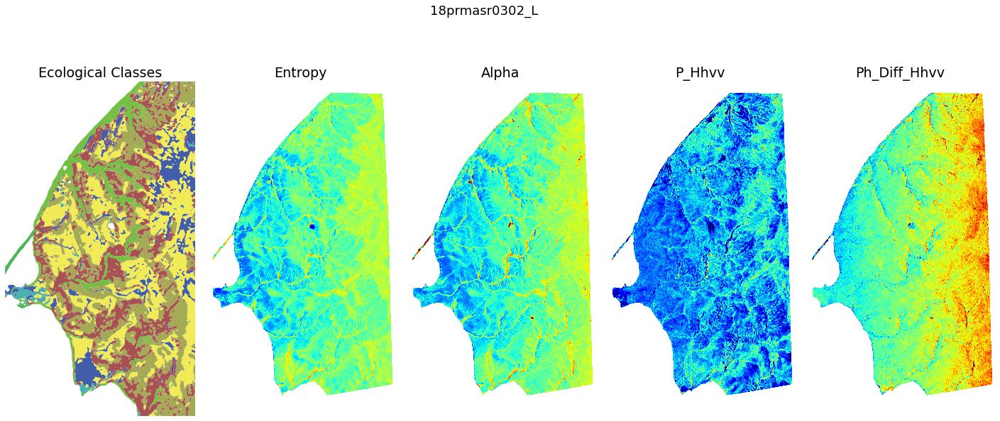

In [72]:

fig_save_name = fig_save.joinpath("./PNG/", "./maps/")
fig, axs, img_extend = plot_grid_classes_alpha_entropy_phh_cpd(path_18=prmasr_nc["L"]["18"][0],
                                                               save_path=fig_save_name,
                                                               shapefile_clip=shape_sorted[1], 
                                                               ecological_classes_path=shape_sorted[0])

<ipython-input-71-4f2a99bb76e2>:96: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  plt.subplots_adjust(wspace=0.05, hspace=0.1)
/data/largeHome/mans_is/.conda/envs/mans_is/envs/py3_mkl/lib/python3.8/site-packages/geopandas/plotting.py:572: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


(569719.3228862986, 7713864.240638912, 575189.3228862986, 7726815.240638912)


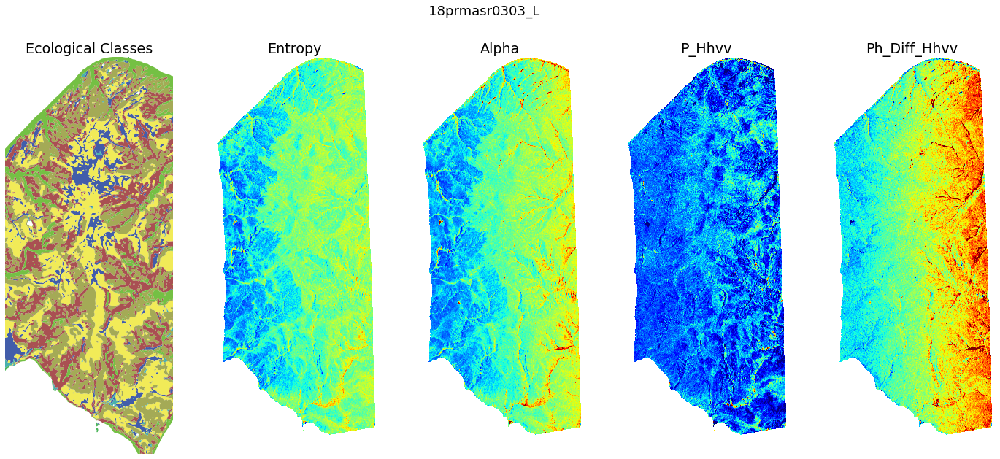

In [73]:

fig_save_name = fig_save.joinpath("./PNG/", "./maps/")
fig, axs, img_extend = plot_grid_classes_alpha_entropy_phh_cpd(path_18=prmasr_nc["L"]["18"][1],
                                                               save_path=fig_save_name,
                                                               shapefile_clip=shape_sorted[1], 
                                                               ecological_classes_path=shape_sorted[0])

<ipython-input-71-4f2a99bb76e2>:96: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  plt.subplots_adjust(wspace=0.05, hspace=0.1)
/data/largeHome/mans_is/.conda/envs/mans_is/envs/py3_mkl/lib/python3.8/site-packages/geopandas/plotting.py:572: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


(567534.2526641657, 7715842.818093983, 572894.2526641657, 7725992.818093983)


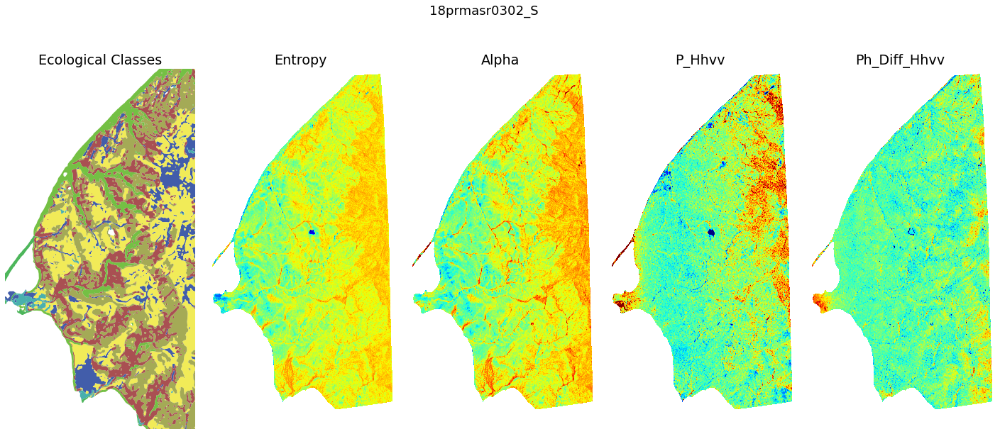

In [75]:

fig_save_name = fig_save.joinpath("./PNG/", "./maps/")
fig, axs, img_extend = plot_grid_classes_alpha_entropy_phh_cpd(path_18=prmasr_nc["S"]["18"][0],
                                                               save_path=fig_save_name,
                                                               shapefile_clip=shape_sorted[1], 
                                                               ecological_classes_path=shape_sorted[0])

<ipython-input-71-4f2a99bb76e2>:96: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  plt.subplots_adjust(wspace=0.05, hspace=0.1)
/data/largeHome/mans_is/.conda/envs/mans_is/envs/py3_mkl/lib/python3.8/site-packages/geopandas/plotting.py:572: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


(569701.9322724811, 7713659.790942493, 575191.9322724811, 7726814.790942493)


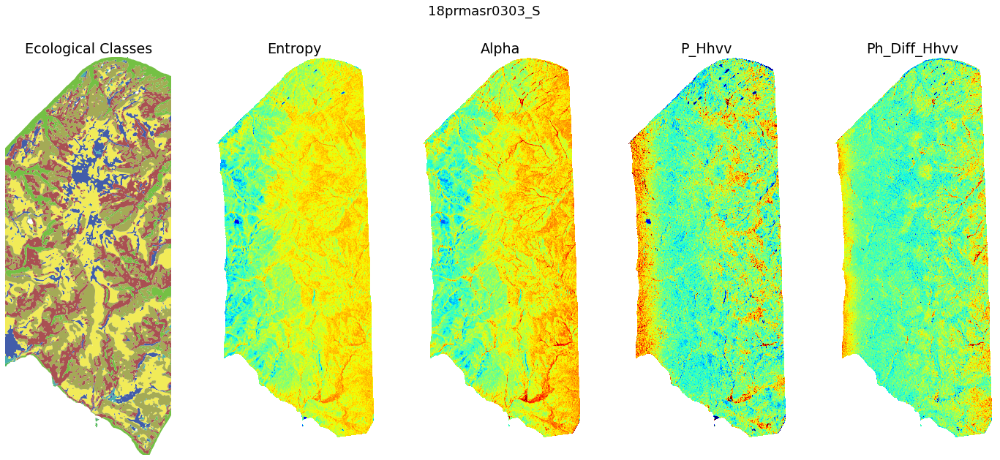

In [76]:

fig_save_name = fig_save.joinpath("./PNG/", "./maps/")
fig, axs, img_extend = plot_grid_classes_alpha_entropy_phh_cpd(path_18=prmasr_nc["S"]["18"][1],
                                                               save_path=fig_save_name,
                                                               shapefile_clip=shape_sorted[1], 
                                                               ecological_classes_path=shape_sorted[0])

<ipython-input-71-4f2a99bb76e2>:96: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  plt.subplots_adjust(wspace=0.05, hspace=0.1)
/data/largeHome/mans_is/.conda/envs/mans_is/envs/py3_mkl/lib/python3.8/site-packages/geopandas/plotting.py:572: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


(567534.2526641657, 7715842.818093983, 572894.2526641657, 7725992.818093983)


<ipython-input-71-4f2a99bb76e2>:96: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  plt.subplots_adjust(wspace=0.05, hspace=0.1)
/data/largeHome/mans_is/.conda/envs/mans_is/envs/py3_mkl/lib/python3.8/site-packages/geopandas/plotting.py:572: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


(569701.9322724811, 7713659.790942493, 575191.9322724811, 7726814.790942493)


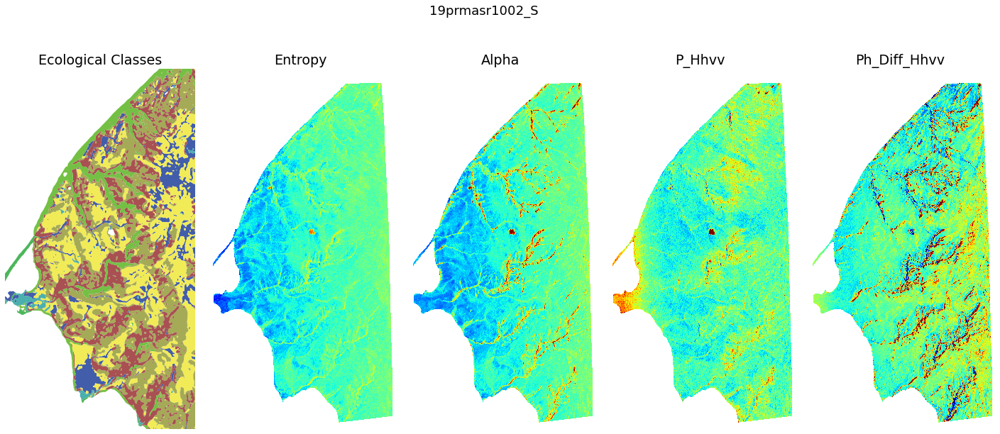

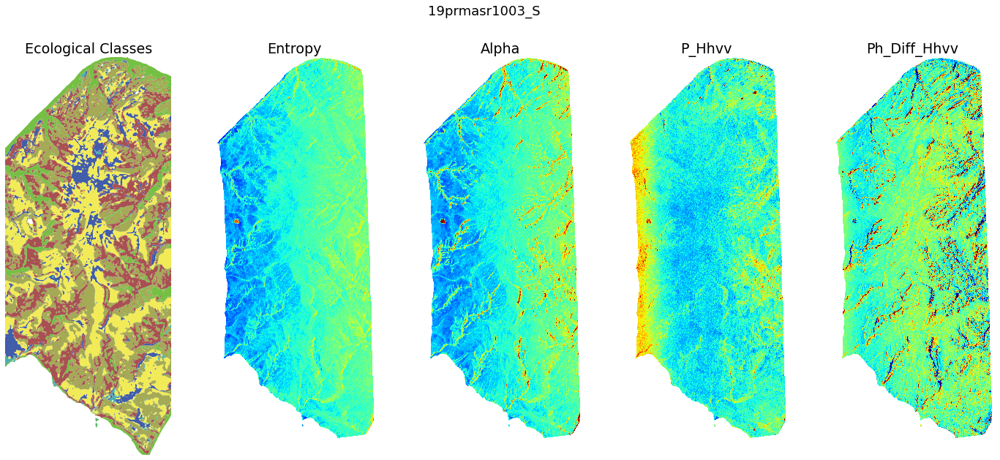

In [77]:

fig_save_name = fig_save.joinpath("./PNG/", "./maps/")
fig, axs, img_extend = plot_grid_classes_alpha_entropy_phh_cpd(path_18=prmasr_nc["S"]["19"][0],
                                                               save_path=fig_save_name,
                                                               shapefile_clip=shape_sorted[1], 
                                                               ecological_classes_path=shape_sorted[0])


fig_save_name = fig_save.joinpath("./PNG/", "./maps/")
fig, axs, img_extend = plot_grid_classes_alpha_entropy_phh_cpd(path_18=prmasr_nc["S"]["19"][1],
                                                               save_path=fig_save_name,
                                                               shapefile_clip=shape_sorted[1], 
                                                               ecological_classes_path=shape_sorted[0])

<ipython-input-71-4f2a99bb76e2>:96: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  plt.subplots_adjust(wspace=0.05, hspace=0.1)
/data/largeHome/mans_is/.conda/envs/mans_is/envs/py3_mkl/lib/python3.8/site-packages/geopandas/plotting.py:572: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


(567539.0381734846, 7716028.680914766, 572894.0381734846, 7725448.680914766)


<ipython-input-71-4f2a99bb76e2>:96: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  plt.subplots_adjust(wspace=0.05, hspace=0.1)
/data/largeHome/mans_is/.conda/envs/mans_is/envs/py3_mkl/lib/python3.8/site-packages/geopandas/plotting.py:572: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


(569719.3228862986, 7713864.240638912, 575189.3228862986, 7726815.240638912)


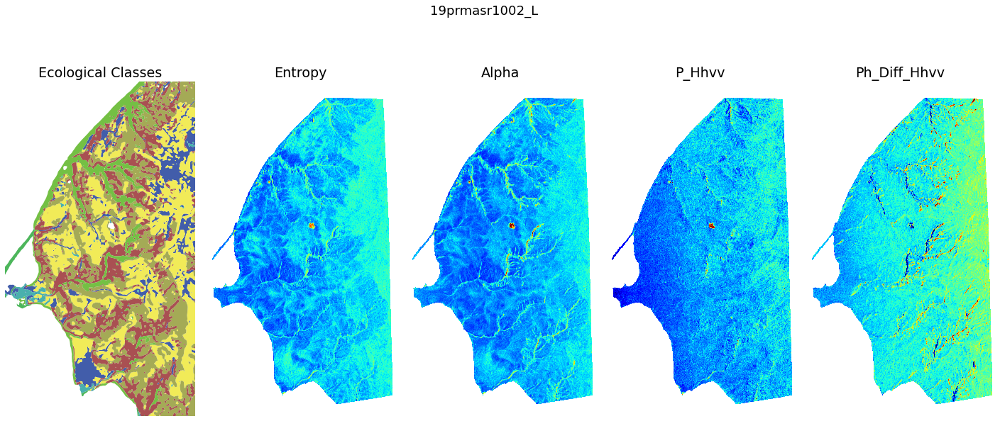

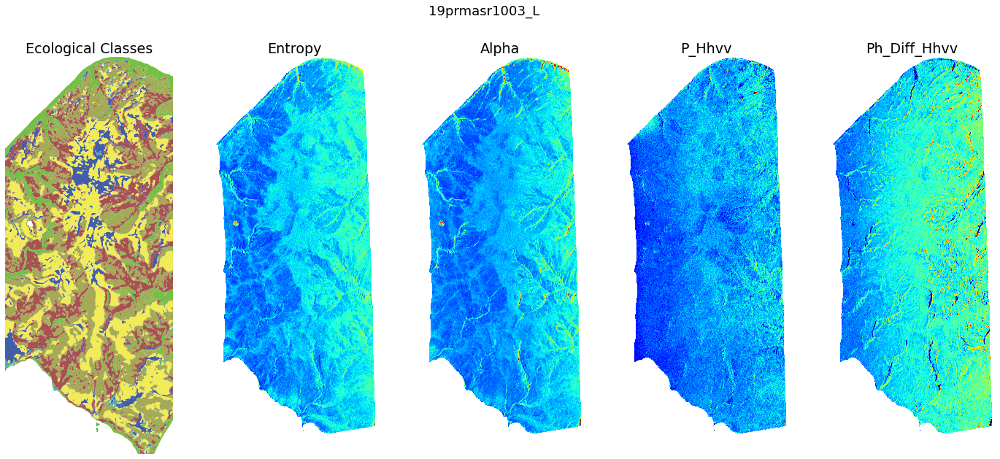

In [78]:

fig_save_name = fig_save.joinpath("./PNG/", "./maps/")
fig, axs, img_extend = plot_grid_classes_alpha_entropy_phh_cpd(path_18=prmasr_nc["L"]["19"][0],
                                                               save_path=fig_save_name,
                                                               shapefile_clip=shape_sorted[1], 
                                                               ecological_classes_path=shape_sorted[0])


fig_save_name = fig_save.joinpath("./PNG/", "./maps/")
fig, axs, img_extend = plot_grid_classes_alpha_entropy_phh_cpd(path_18=prmasr_nc["L"]["19"][1],
                                                               save_path=fig_save_name,
                                                               shapefile_clip=shape_sorted[1], 
                                                               ecological_classes_path=shape_sorted[0])

<ipython-input-68-116b64f6f9da>:96: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  plt.subplots_adjust(wspace=0.05, hspace=0.1)
/data/largeHome/mans_is/.conda/envs/mans_is/envs/py3_mkl/lib/python3.8/site-packages/geopandas/plotting.py:572: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


(567539.0381734846, 7716028.680914766, 572894.0381734846, 7725448.680914766)


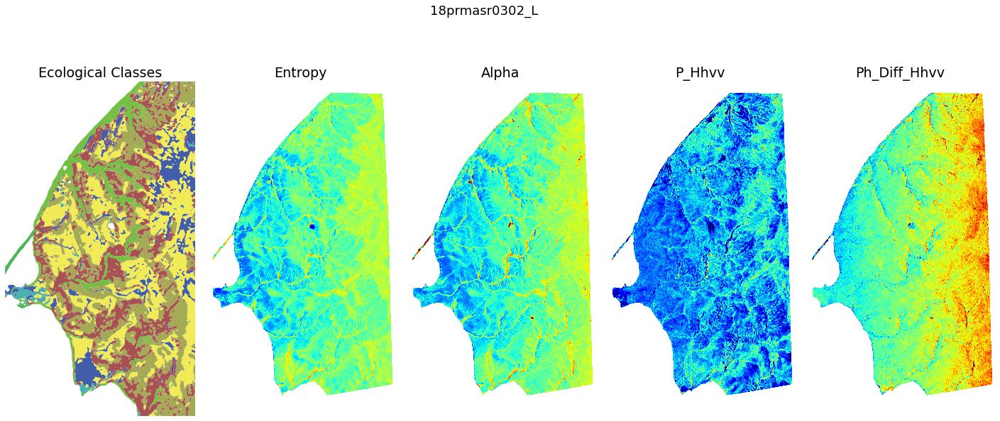

In [69]:

fig_save_name = fig_save.joinpath("./PNG/", "./maps/")
fig, axs, img_extend = plot_grid_classes_alpha_entropy_phh_cpd(path_18=prmasr_nc["L"]["18"][0],
                                                               save_path=fig_save_name,
                                                               shapefile_clip=shape_sorted[1], 
                                                               ecological_classes_path=shape_sorted[0])

<ipython-input-68-116b64f6f9da>:96: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  plt.subplots_adjust(wspace=0.05, hspace=0.1)
/data/largeHome/mans_is/.conda/envs/mans_is/envs/py3_mkl/lib/python3.8/site-packages/geopandas/plotting.py:572: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


(569719.3228862986, 7713864.240638912, 575189.3228862986, 7726815.240638912)


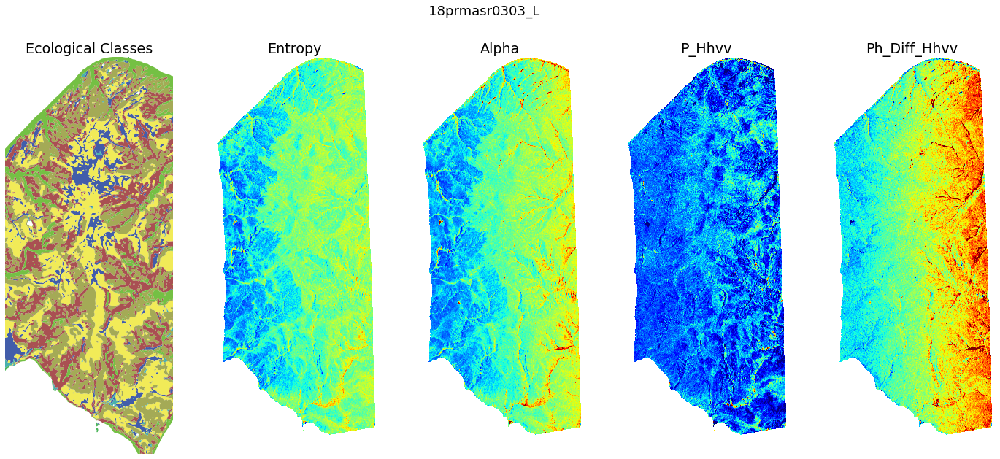

In [70]:
fig, axs, img_extend = plot_grid_classes_alpha_entropy_phh_cpd(path_18=prmasr_nc["L"]["18"][1], shapefile_clip=shape_sorted[1], ecological_classes_path=shape_sorted[0])

In [53]:
axs[1].

AttributeError: 'GeoAxesSubplot' object has no attribute 'extent'

NameError: name 'img_extend' is not defined

/data/largeHome/mans_is/.conda/envs/mans_is/envs/py3_mkl/lib/python3.8/site-packages/geopandas/plotting.py:572: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


<GeoAxesSubplot:>

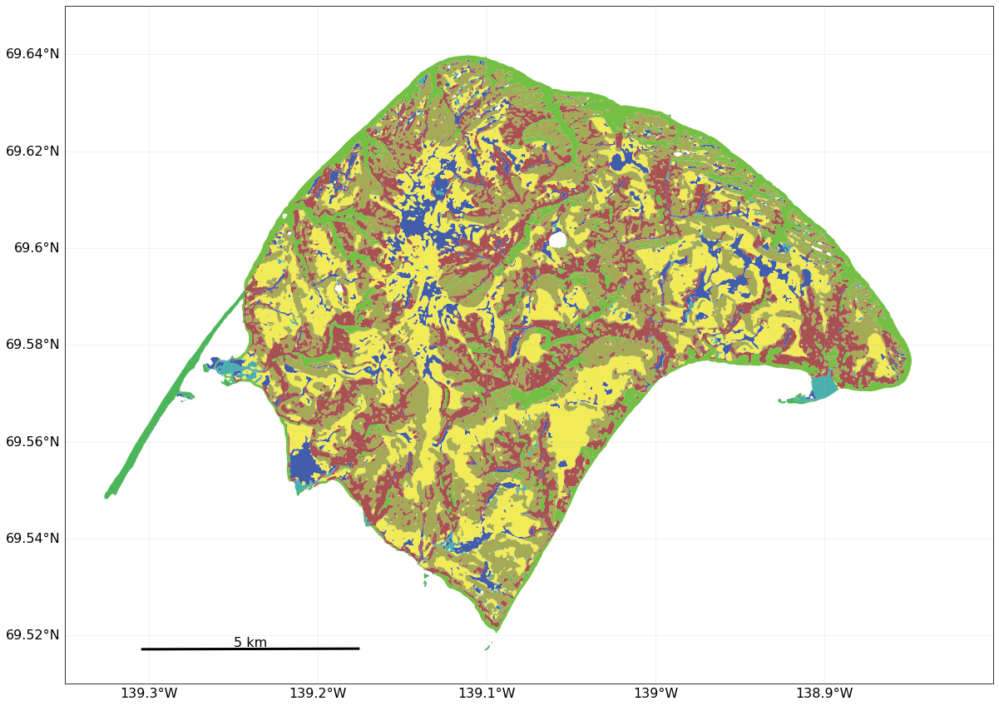

In [40]:
from cartopy import crs as ccrs
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

extent = [-139.35, -138.8, 69.51,  69.65]          # Extent of Herschel Island in Lat/Long
crs_epsg = ccrs.epsg('3857')
df_epsg = ecological_classes.to_crs(epsg='3857')


# Generate a figure with two axes, one for CartoPy, one for GeoPandas
fig, axs = plt.subplots(1, 1, subplot_kw={'projection': crs_epsg},
                        figsize=(20, 20))

ax = pypolsar.plot.map.MapPlot(ax=axs, extend=extent, scale_bar_plot=True, scale_bar_length=5,  scale_bar_location=(0.2, 0.05), scale_bar_linewidth=3)

df_epsg.plot(ax=ax, column='UnitName', color=colors_hex)



In [51]:
ax.set_extent

<GeoAxesSubplot:>

In [ ]:
ax.crs

In [32]:
df_epsg['geometry']

0    MULTIPOLYGON (((-15484580.158 10913260.039, -1...
1    MULTIPOLYGON (((-15483531.323 10915410.388, -1...
2    MULTIPOLYGON (((-15483805.708 10915530.299, -1...
3    MULTIPOLYGON (((-15484291.051 10915105.337, -1...
4    MULTIPOLYGON (((-15484096.200 10915533.270, -1...
5    MULTIPOLYGON (((-15483588.050 10915375.047, -1...
6    MULTIPOLYGON (((-15488692.968 10917611.291, -1...
Name: geometry, dtype: geometry

In [ ]:
def ax_eco_map():
    